# TACO Dataset Exploration

Exploracion completa del dataset TACO para deteccion de basura

Dataset: TACO Trash Dataset  
Fuente: Kaggle

In [18]:
import json
import os
from pathlib import Path
import matplotlib.pyplot as plt
import numpy as np
from collections import Counter
import random
from PIL import Image

## 1. Cargar Dataset

In [19]:
dataset_path = Path("../../data/raw/datasets/kneroma/tacotrashdataset/versions/3/data")
annotations_file = dataset_path / "annotations.json"

with open(annotations_file, 'r') as f:
    data = json.load(f)

print("Dataset cargado correctamente")
print(f"Claves principales: {list(data.keys())}")

Dataset cargado correctamente
Claves principales: ['info', 'images', 'annotations', 'scene_annotations', 'licenses', 'categories', 'scene_categories']


## 2. Estadisticas Generales

In [20]:
total_images = len(data['images'])
total_annotations = len(data['annotations'])
total_categories = len(data['categories'])

print("=== ESTADISTICAS GENERALES ===")
print(f"Total de imagenes: {total_images}")
print(f"Total de anotaciones: {total_annotations}")
print(f"Total de categorias: {total_categories}")
print(f"Promedio de anotaciones por imagen: {total_annotations / total_images:.2f}")

=== ESTADISTICAS GENERALES ===
Total de imagenes: 1500
Total de anotaciones: 4784
Total de categorias: 60
Promedio de anotaciones por imagen: 3.19


### 2.1 Informacion de Imagenes

In [21]:
widths = [img['width'] for img in data['images']]
heights = [img['height'] for img in data['images']]

print("\n=== DIMENSIONES DE IMAGENES ===")
print(f"Ancho minimo: {min(widths)} px")
print(f"Ancho maximo: {max(widths)} px")
print(f"Ancho promedio: {np.mean(widths):.2f} px")
print(f"Alto minimo: {min(heights)} px")
print(f"Alto maximo: {max(heights)} px")
print(f"Alto promedio: {np.mean(heights):.2f} px")


=== DIMENSIONES DE IMAGENES ===
Ancho minimo: 842 px
Ancho maximo: 6000 px
Ancho promedio: 2824.88 px
Alto minimo: 474 px
Alto maximo: 5312 px
Alto promedio: 3222.83 px


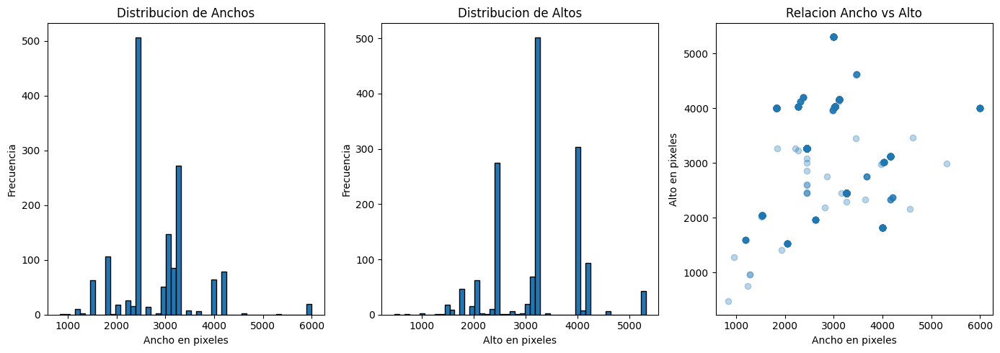

In [22]:
plt.figure(figsize=(14, 5))

plt.subplot(1, 3, 1)
plt.hist(widths, bins=50, edgecolor='black')
plt.xlabel('Ancho en pixeles')
plt.ylabel('Frecuencia')
plt.title('Distribucion de Anchos')

plt.subplot(1, 3, 2)
plt.hist(heights, bins=50, edgecolor='black')
plt.xlabel('Alto en pixeles')
plt.ylabel('Frecuencia')
plt.title('Distribucion de Altos')

plt.subplot(1, 3, 3)
plt.scatter(widths, heights, alpha=0.3)
plt.xlabel('Ancho en pixeles')
plt.ylabel('Alto en pixeles')
plt.title('Relacion Ancho vs Alto')

plt.tight_layout()
plt.show()

### 2.2 Formato de Imagenes

In [23]:
file_extensions = [Path(img['file_name']).suffix for img in data['images']]
extension_counts = Counter(file_extensions)

print("\n=== FORMATOS DE IMAGENES ===")
for ext, count in extension_counts.items():
    print(f"{ext}: {count} ({count/len(file_extensions)*100:.2f}%)")


=== FORMATOS DE IMAGENES ===
.jpg: 833 (55.53%)
.JPG: 667 (44.47%)


## 3. Estructura de Etiquetas

In [24]:
print("\n=== CATEGORIAS DEL DATASET ===")
print(f"Total de categorias: {len(data['categories'])}")
print("\nPrimeras 10 categorias:")
for cat in data['categories'][:10]:
    print(f"ID: {cat['id']} - {cat['name']} (Supercategoria: {cat['supercategory']})")


=== CATEGORIAS DEL DATASET ===
Total de categorias: 60

Primeras 10 categorias:
ID: 0 - Aluminium foil (Supercategoria: Aluminium foil)
ID: 1 - Battery (Supercategoria: Battery)
ID: 2 - Aluminium blister pack (Supercategoria: Blister pack)
ID: 3 - Carded blister pack (Supercategoria: Blister pack)
ID: 4 - Other plastic bottle (Supercategoria: Bottle)
ID: 5 - Clear plastic bottle (Supercategoria: Bottle)
ID: 6 - Glass bottle (Supercategoria: Bottle)
ID: 7 - Plastic bottle cap (Supercategoria: Bottle cap)
ID: 8 - Metal bottle cap (Supercategoria: Bottle cap)
ID: 9 - Broken glass (Supercategoria: Broken glass)


In [25]:
supercategories = [cat['supercategory'] for cat in data['categories']]
super_counts = Counter(supercategories)

print(f"\n=== SUPERCATEGORIAS ===")
print(f"Total de supercategorias: {len(super_counts)}")
for super_cat, count in super_counts.most_common():
    print(f"{super_cat}: {count} categorias")


=== SUPERCATEGORIAS ===
Total de supercategorias: 28
Carton: 7 categorias
Plastic bag & wrapper: 7 categorias
Cup: 5 categorias
Plastic container: 5 categorias
Paper: 4 categorias
Bottle: 3 categorias
Can: 3 categorias
Blister pack: 2 categorias
Bottle cap: 2 categorias
Lid: 2 categorias
Paper bag: 2 categorias
Straw: 2 categorias
Aluminium foil: 1 categorias
Battery: 1 categorias
Broken glass: 1 categorias
Food waste: 1 categorias
Glass jar: 1 categorias
Other plastic: 1 categorias
Plastic glooves: 1 categorias
Plastic utensils: 1 categorias
Pop tab: 1 categorias
Rope & strings: 1 categorias
Scrap metal: 1 categorias
Shoe: 1 categorias
Squeezable tube: 1 categorias
Styrofoam piece: 1 categorias
Unlabeled litter: 1 categorias
Cigarette: 1 categorias


## 4. Visualizacion de Muestras Aleatorias

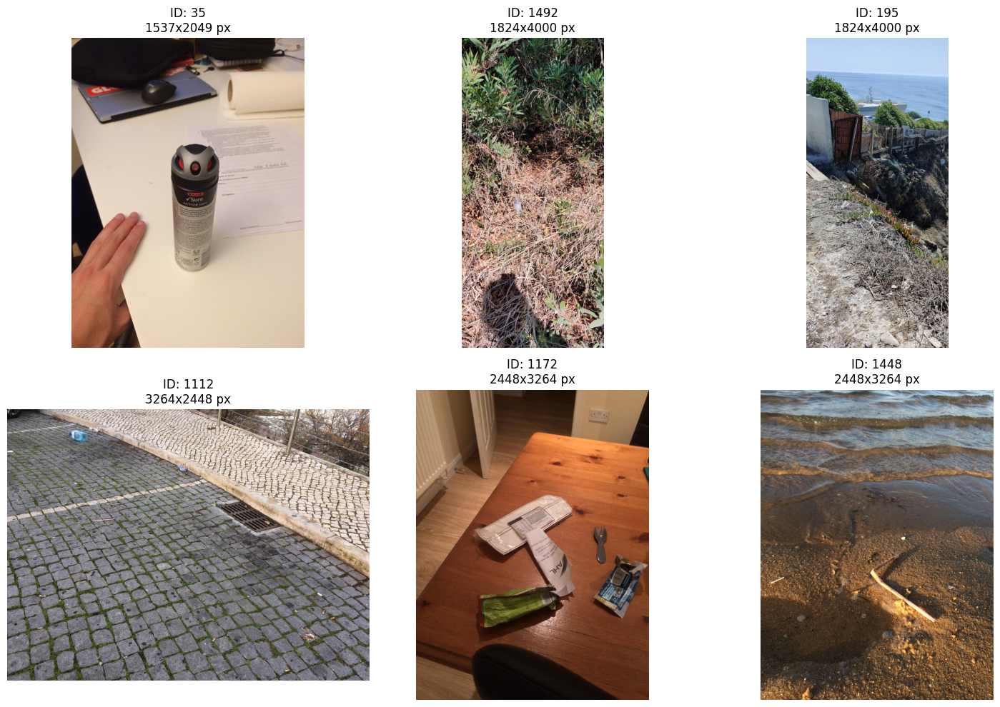

In [26]:
def visualize_sample_images(data, dataset_path, num_samples=6):
    random_images = random.sample(data['images'], num_samples)
    
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    axes = axes.flatten()
    
    for idx, img_info in enumerate(random_images):
        img_path = dataset_path / img_info['file_name']
        
        if img_path.exists():
            img = Image.open(img_path)
            axes[idx].imshow(img)
            axes[idx].set_title(f"ID: {img_info['id']}\n{img_info['width']}x{img_info['height']} px")
            axes[idx].axis('off')
        else:
            axes[idx].text(0.5, 0.5, 'Imagen no encontrada', ha='center', va='center')
            axes[idx].axis('off')
    
    plt.tight_layout()
    plt.show()

visualize_sample_images(data, dataset_path)

## 5. Analisis Especifico de Anotaciones

### 5.1 Distribucion de Clases

In [27]:
category_ids = [ann['category_id'] for ann in data['annotations']]
category_counts = Counter(category_ids)

id_to_name = {cat['id']: cat['name'] for cat in data['categories']}

print("\n=== DISTRIBUCION DE CLASES ===")
print(f"Total de clases con datos: {len(category_counts)}")
print(f"\nTop 10 clases mas frecuentes:")
for cat_id, count in category_counts.most_common(10):
    print(f"{id_to_name[cat_id]}: {count} anotaciones ({count/len(category_ids)*100:.2f}%)")


=== DISTRIBUCION DE CLASES ===
Total de clases con datos: 59

Top 10 clases mas frecuentes:
Cigarette: 667 anotaciones (13.94%)
Unlabeled litter: 517 anotaciones (10.81%)
Plastic film: 451 anotaciones (9.43%)
Clear plastic bottle: 285 anotaciones (5.96%)
Other plastic: 273 anotaciones (5.71%)
Other plastic wrapper: 260 anotaciones (5.43%)
Drink can: 229 anotaciones (4.79%)
Plastic bottle cap: 209 anotaciones (4.37%)
Plastic straw: 157 anotaciones (3.28%)
Broken glass: 138 anotaciones (2.88%)


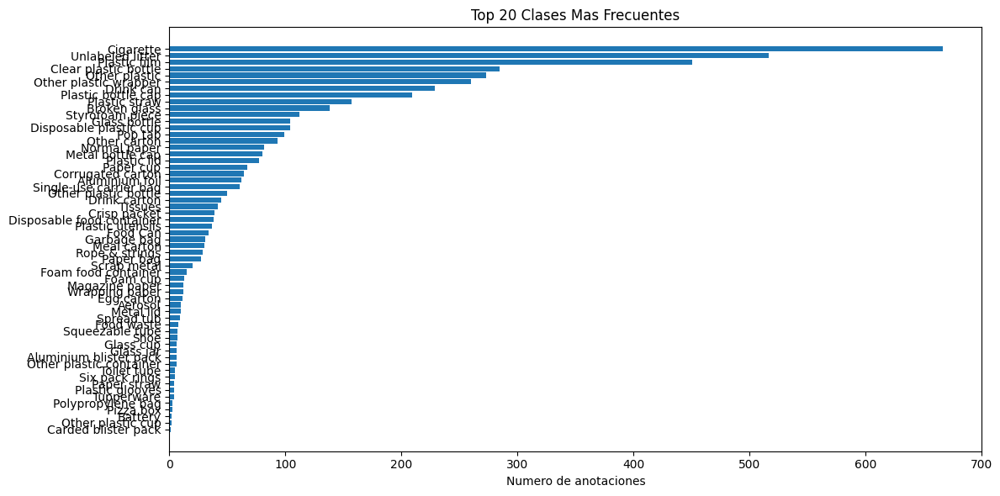

In [ ]:
top_20_classes = category_counts.most_common(60)
class_names = [id_to_name[cat_id] for cat_id, _ in top_20_classes]
class_values = [count for _, count in top_20_classes]

plt.figure(figsize=(12, 24))
plt.barh(class_names, class_values)
plt.xlabel('Numero de anotaciones')
plt.title('Top 20 Clases Mas Frecuentes')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

### 5.2 Tamanos de Bounding Boxes

In [29]:
bbox_widths = [ann['bbox'][2] for ann in data['annotations']]
bbox_heights = [ann['bbox'][3] for ann in data['annotations']]
bbox_areas = [w * h for w, h in zip(bbox_widths, bbox_heights)]

print("\n=== ESTADISTICAS DE BOUNDING BOXES ===")
print(f"Ancho minimo: {min(bbox_widths):.2f} px")
print(f"Ancho maximo: {max(bbox_widths):.2f} px")
print(f"Ancho promedio: {np.mean(bbox_widths):.2f} px")
print(f"Alto minimo: {min(bbox_heights):.2f} px")
print(f"Alto maximo: {max(bbox_heights):.2f} px")
print(f"Alto promedio: {np.mean(bbox_heights):.2f} px")
print(f"Area minima: {min(bbox_areas):.2f} px²")
print(f"Area maxima: {max(bbox_areas):.2f} px²")
print(f"Area promedio: {np.mean(bbox_areas):.2f} px²")


=== ESTADISTICAS DE BOUNDING BOXES ===
Ancho minimo: 10.00 px
Ancho maximo: 3758.00 px
Ancho promedio: 331.43 px
Alto minimo: 4.00 px
Alto maximo: 3995.00 px
Alto promedio: 320.25 px
Area minima: 80.00 px²
Area maxima: 10992160.00 px²
Area promedio: 263954.62 px²


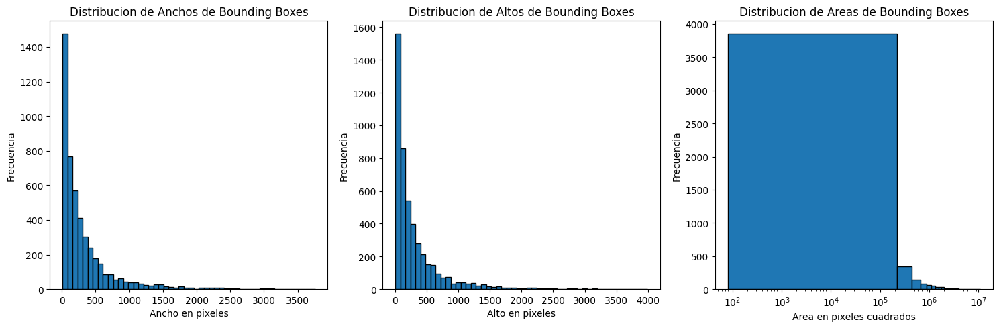

In [30]:
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.hist(bbox_widths, bins=50, edgecolor='black')
plt.xlabel('Ancho en pixeles')
plt.ylabel('Frecuencia')
plt.title('Distribucion de Anchos de Bounding Boxes')

plt.subplot(1, 3, 2)
plt.hist(bbox_heights, bins=50, edgecolor='black')
plt.xlabel('Alto en pixeles')
plt.ylabel('Frecuencia')
plt.title('Distribucion de Altos de Bounding Boxes')

plt.subplot(1, 3, 3)
plt.hist(bbox_areas, bins=50, edgecolor='black')
plt.xlabel('Area en pixeles cuadrados')
plt.ylabel('Frecuencia')
plt.title('Distribucion de Areas de Bounding Boxes')
plt.xscale('log')

plt.tight_layout()
plt.show()

### 5.3 Objetos por Imagen

In [31]:
image_annotations = {}
for ann in data['annotations']:
    img_id = ann['image_id']
    if img_id not in image_annotations:
        image_annotations[img_id] = 0
    image_annotations[img_id] += 1

annotations_per_image = list(image_annotations.values())

print("\n=== OBJETOS POR IMAGEN ===")
print(f"Minimo de objetos: {min(annotations_per_image)}")
print(f"Maximo de objetos: {max(annotations_per_image)}")
print(f"Promedio de objetos: {np.mean(annotations_per_image):.2f}")
print(f"Mediana de objetos: {np.median(annotations_per_image):.2f}")


=== OBJETOS POR IMAGEN ===
Minimo de objetos: 1
Maximo de objetos: 90
Promedio de objetos: 3.19
Mediana de objetos: 2.00


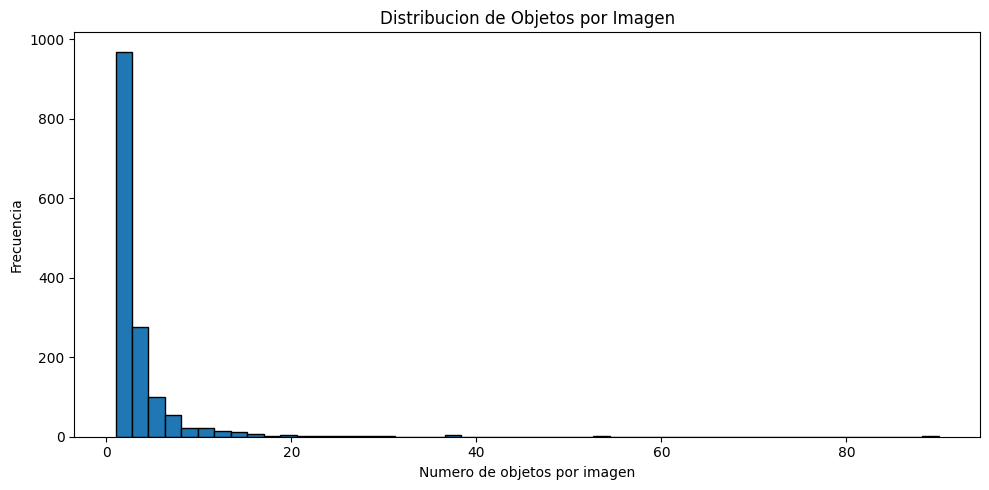

In [32]:
plt.figure(figsize=(10, 5))
plt.hist(annotations_per_image, bins=50, edgecolor='black')
plt.xlabel('Numero de objetos por imagen')
plt.ylabel('Frecuencia')
plt.title('Distribucion de Objetos por Imagen')
plt.tight_layout()
plt.show()

## 6. Visualizacion de Muestras con Anotaciones

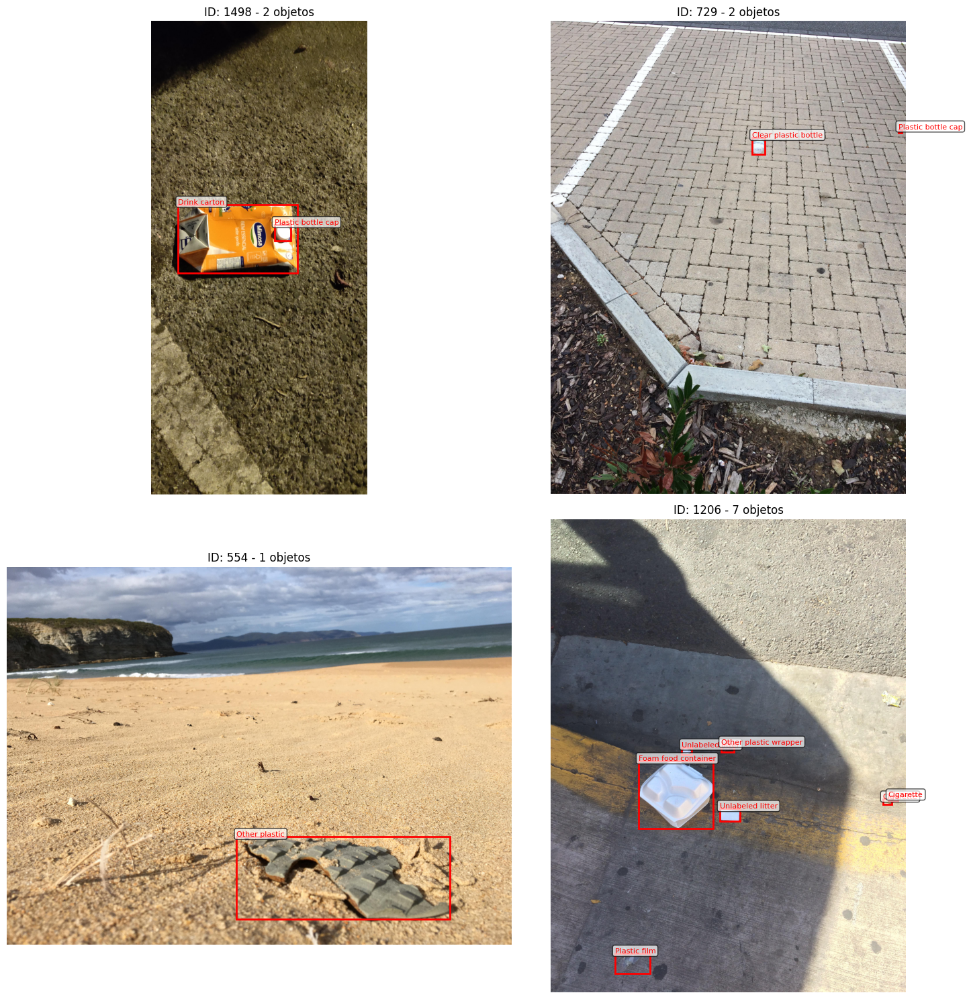

In [33]:
def visualize_annotated_images(data, dataset_path, num_samples=4):
    import matplotlib.patches as patches
    
    random_images = random.sample(data['images'], num_samples)
    
    fig, axes = plt.subplots(2, 2, figsize=(15, 15))
    axes = axes.flatten()
    
    for idx, img_info in enumerate(random_images):
        img_path = dataset_path / img_info['file_name']
        
        if not img_path.exists():
            continue
            
        img = Image.open(img_path)
        axes[idx].imshow(img)
        
        img_annotations = [ann for ann in data['annotations'] if ann['image_id'] == img_info['id']]
        
        for ann in img_annotations:
            bbox = ann['bbox']
            x, y, w, h = bbox
            
            rect = patches.Rectangle((x, y), w, h, linewidth=2, edgecolor='red', facecolor='none')
            axes[idx].add_patch(rect)
            
            cat_name = id_to_name[ann['category_id']]
            axes[idx].text(x, y - 5, cat_name, color='red', fontsize=8, 
                          bbox=dict(boxstyle='round', facecolor='white', alpha=0.7))
        
        axes[idx].set_title(f"ID: {img_info['id']} - {len(img_annotations)} objetos")
        axes[idx].axis('off')
    
    plt.tight_layout()
    plt.show()

visualize_annotated_images(data, dataset_path)

## 7. Analisis de Calidad de Imagenes

### 7.1 Brillo, Contraste y Ruido

In [34]:
import cv2

def calculate_image_quality_metrics(img_path):
    img = cv2.imread(str(img_path))
    if img is None:
        return None
    
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    brightness = np.mean(gray)
    
    contrast = np.std(gray)
    
    laplacian = cv2.Laplacian(gray, cv2.CV_64F)
    noise = np.var(laplacian)
    
    return {
        'brightness': brightness,
        'contrast': contrast,
        'noise': noise
    }

print("Calculando metricas de calidad para todas las imagenes...")
quality_metrics = []

for img_info in data['images']:
    img_path = dataset_path / img_info['file_name']
    if img_path.exists():
        metrics = calculate_image_quality_metrics(img_path)
        if metrics:
            quality_metrics.append({
                'image_id': img_info['id'],
                'file_name': img_info['file_name'],
                **metrics
            })

print(f"Metricas calculadas para {len(quality_metrics)} imagenes")

Calculando metricas de calidad para todas las imagenes...
Metricas calculadas para 1500 imagenes
Metricas calculadas para 1500 imagenes


## 9. Resumen Final

In [35]:
print("\n=== RESUMEN FINAL ===")
print(f"Dataset: TACO Trash Detection")
print(f"Total de imagenes: {total_images}")
print(f"Total de anotaciones: {total_annotations}")
print(f"Total de categorias: {total_categories}")
print(f"Promedio de objetos por imagen: {np.mean(annotations_per_image):.2f}")
print(f"Resolucion promedio: {np.mean(widths):.0f}x{np.mean(heights):.0f} px")
print(f"Area promedio de bounding box: {np.mean(bbox_areas):.0f} px²")
print("\nRecomendaciones:")
print("- Evaluar balance de clases")
print("- Considerar data augmentation para clases minoritarias")
print("- Normalizar resoluciones de imagenes para entrenamiento")
print("- Analizar objetos pequenos que pueden dificultar la deteccion")


=== RESUMEN FINAL ===
Dataset: TACO Trash Detection
Total de imagenes: 1500
Total de anotaciones: 4784
Total de categorias: 60
Promedio de objetos por imagen: 3.19
Resolucion promedio: 2825x3223 px
Area promedio de bounding box: 263955 px²

Recomendaciones:
- Evaluar balance de clases
- Considerar data augmentation para clases minoritarias
- Normalizar resoluciones de imagenes para entrenamiento
- Analizar objetos pequenos que pueden dificultar la deteccion


In [36]:
brightness_values = [m['brightness'] for m in quality_metrics]
contrast_values = [m['contrast'] for m in quality_metrics]
noise_values = [m['noise'] for m in quality_metrics]

print("\n=== ESTADISTICAS DE CALIDAD DE IMAGEN ===")
print(f"\nBrillo:")
print(f"  Minimo: {min(brightness_values):.2f}")
print(f"  Maximo: {max(brightness_values):.2f}")
print(f"  Promedio: {np.mean(brightness_values):.2f}")

print(f"\nContraste:")
print(f"  Minimo: {min(contrast_values):.2f}")
print(f"  Maximo: {max(contrast_values):.2f}")
print(f"  Promedio: {np.mean(contrast_values):.2f}")

print(f"\nRuido:")
print(f"  Minimo: {min(noise_values):.2f}")
print(f"  Maximo: {max(noise_values):.2f}")
print(f"  Promedio: {np.mean(noise_values):.2f}")


=== ESTADISTICAS DE CALIDAD DE IMAGEN ===

Brillo:
  Minimo: 22.78
  Maximo: 207.55
  Promedio: 119.91

Contraste:
  Minimo: 15.08
  Maximo: 83.35
  Promedio: 52.89

Ruido:
  Minimo: 2.85
  Maximo: 14236.24
  Promedio: 1169.83


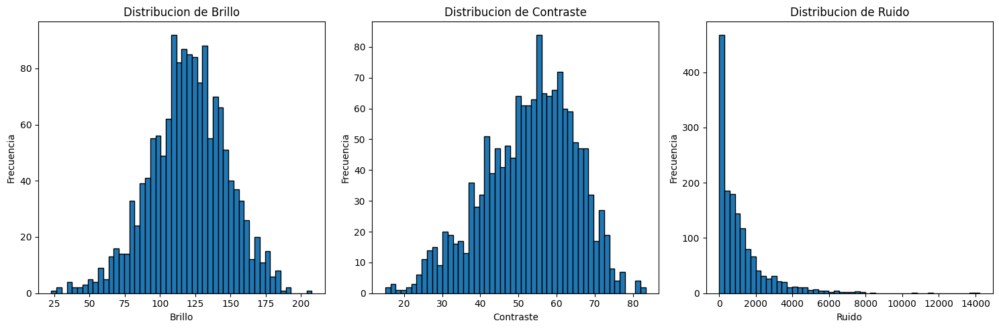

In [37]:
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.hist(brightness_values, bins=50, edgecolor='black')
plt.xlabel('Brillo')
plt.ylabel('Frecuencia')
plt.title('Distribucion de Brillo')

plt.subplot(1, 3, 2)
plt.hist(contrast_values, bins=50, edgecolor='black')
plt.xlabel('Contraste')
plt.ylabel('Frecuencia')
plt.title('Distribucion de Contraste')

plt.subplot(1, 3, 3)
plt.hist(noise_values, bins=50, edgecolor='black')
plt.xlabel('Ruido')
plt.ylabel('Frecuencia')
plt.title('Distribucion de Ruido')

plt.tight_layout()
plt.show()

### 7.2 Casos Extremos de Brillo


=== CASOS EXTREMOS DE BRILLO ===

Imagenes MAS BRILLANTES:
1. batch_3/IMG_4868.JPG - Brillo: 207.55
2. batch_2/000086.JPG - Brillo: 191.28
3. batch_3/IMG_4878.JPG - Brillo: 190.33

Imagenes MENOS BRILLANTES:
1. batch_7/000031.JPG - Brillo: 22.78
2. batch_3/IMG_5040.JPG - Brillo: 28.27
3. batch_2/000092.JPG - Brillo: 28.63


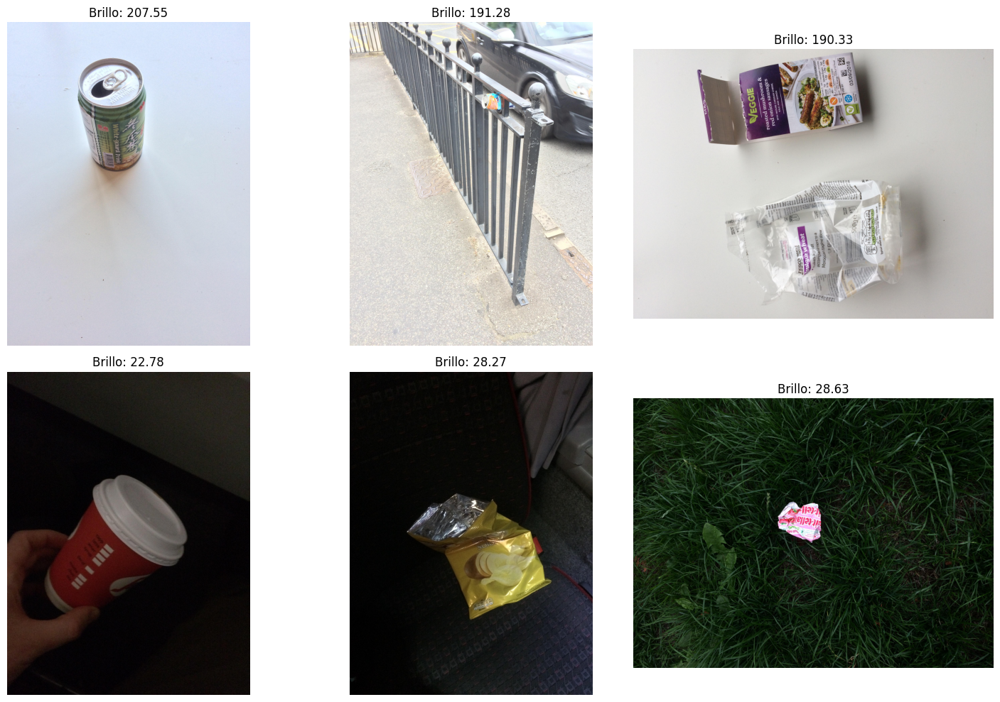

In [38]:
sorted_by_brightness = sorted(quality_metrics, key=lambda x: x['brightness'])

top_3_bright = sorted_by_brightness[-3:]
bottom_3_bright = sorted_by_brightness[:3]

fig, axes = plt.subplots(2, 3, figsize=(15, 10))

print("\n=== CASOS EXTREMOS DE BRILLO ===")
print("\nImagenes MAS BRILLANTES:")
for idx, metric in enumerate(reversed(top_3_bright)):
    print(f"{idx+1}. {metric['file_name']} - Brillo: {metric['brightness']:.2f}")
    img_path = dataset_path / metric['file_name']
    if img_path.exists():
        img = Image.open(img_path)
        axes[0, idx].imshow(img)
        axes[0, idx].set_title(f"Brillo: {metric['brightness']:.2f}")
        axes[0, idx].axis('off')

print("\nImagenes MENOS BRILLANTES:")
for idx, metric in enumerate(bottom_3_bright):
    print(f"{idx+1}. {metric['file_name']} - Brillo: {metric['brightness']:.2f}")
    img_path = dataset_path / metric['file_name']
    if img_path.exists():
        img = Image.open(img_path)
        axes[1, idx].imshow(img)
        axes[1, idx].set_title(f"Brillo: {metric['brightness']:.2f}")
        axes[1, idx].axis('off')

plt.tight_layout()
plt.show()

### 7.3 Casos Extremos de Contraste


=== CASOS EXTREMOS DE CONTRASTE ===

Imagenes con MAS CONTRASTE:
1. batch_12/000070.jpg - Contraste: 83.35
2. batch_7/000045.JPG - Contraste: 82.63
3. batch_8/000073.jpg - Contraste: 81.39

Imagenes con MENOS CONTRASTE:
1. batch_11/000088.jpg - Contraste: 15.08
2. batch_12/000042.jpg - Contraste: 15.68
3. batch_3/IMG_4916.JPG - Contraste: 16.62
2. batch_12/000042.jpg - Contraste: 15.68
3. batch_3/IMG_4916.JPG - Contraste: 16.62


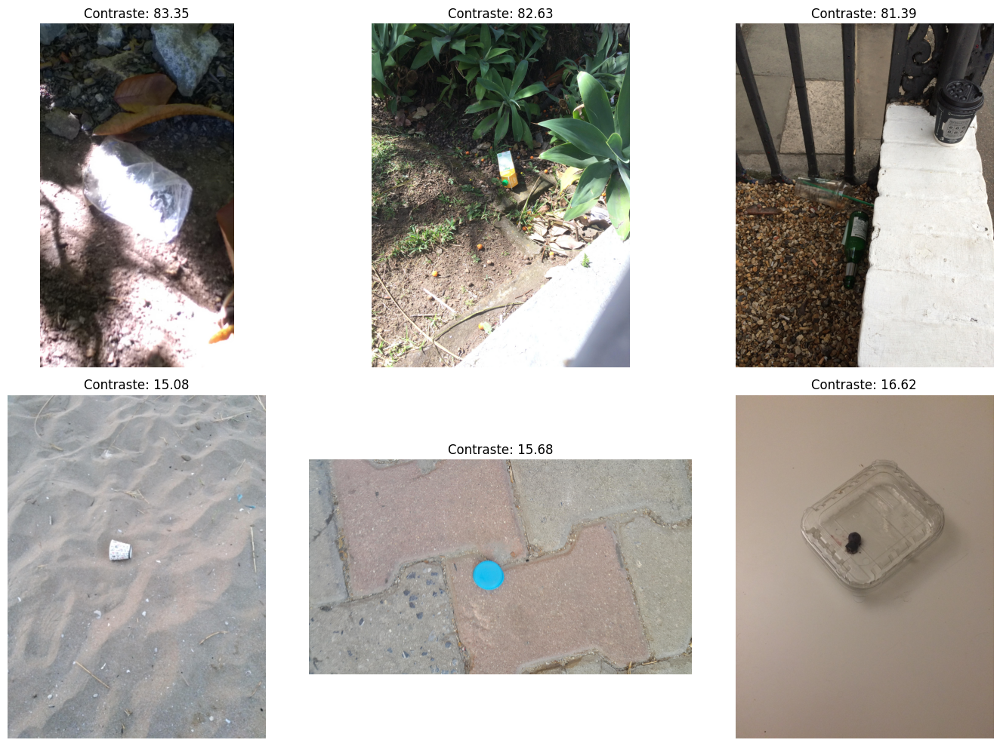

In [39]:
sorted_by_contrast = sorted(quality_metrics, key=lambda x: x['contrast'])

top_3_contrast = sorted_by_contrast[-3:]
bottom_3_contrast = sorted_by_contrast[:3]

fig, axes = plt.subplots(2, 3, figsize=(15, 10))

print("\n=== CASOS EXTREMOS DE CONTRASTE ===")
print("\nImagenes con MAS CONTRASTE:")
for idx, metric in enumerate(reversed(top_3_contrast)):
    print(f"{idx+1}. {metric['file_name']} - Contraste: {metric['contrast']:.2f}")
    img_path = dataset_path / metric['file_name']
    if img_path.exists():
        img = Image.open(img_path)
        axes[0, idx].imshow(img)
        axes[0, idx].set_title(f"Contraste: {metric['contrast']:.2f}")
        axes[0, idx].axis('off')

print("\nImagenes con MENOS CONTRASTE:")
for idx, metric in enumerate(bottom_3_contrast):
    print(f"{idx+1}. {metric['file_name']} - Contraste: {metric['contrast']:.2f}")
    img_path = dataset_path / metric['file_name']
    if img_path.exists():
        img = Image.open(img_path)
        axes[1, idx].imshow(img)
        axes[1, idx].set_title(f"Contraste: {metric['contrast']:.2f}")
        axes[1, idx].axis('off')

plt.tight_layout()
plt.show()

### 7.4 Casos Extremos de Ruido


=== CASOS EXTREMOS DE RUIDO ===

Imagenes con MAS RUIDO:
1. batch_15/000070.jpg - Ruido: 14236.24
2. batch_15/000024.jpg - Ruido: 13672.79
3. batch_15/000018.jpg - Ruido: 11527.48

Imagenes con MENOS RUIDO:
1. batch_12/000065.jpg - Ruido: 2.85
2. batch_12/000064.jpg - Ruido: 3.58
3. batch_13/000023.jpg - Ruido: 6.34
3. batch_13/000023.jpg - Ruido: 6.34


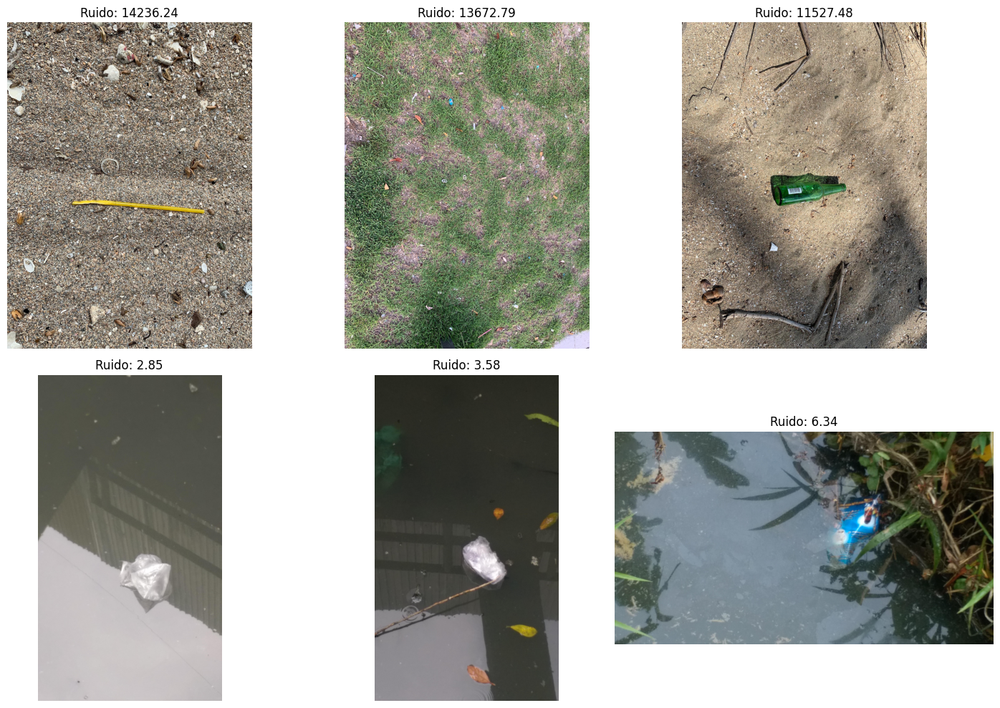

In [40]:
sorted_by_noise = sorted(quality_metrics, key=lambda x: x['noise'])

top_3_noise = sorted_by_noise[-3:]
bottom_3_noise = sorted_by_noise[:3]

fig, axes = plt.subplots(2, 3, figsize=(15, 10))

print("\n=== CASOS EXTREMOS DE RUIDO ===")
print("\nImagenes con MAS RUIDO:")
for idx, metric in enumerate(reversed(top_3_noise)):
    print(f"{idx+1}. {metric['file_name']} - Ruido: {metric['noise']:.2f}")
    img_path = dataset_path / metric['file_name']
    if img_path.exists():
        img = Image.open(img_path)
        axes[0, idx].imshow(img)
        axes[0, idx].set_title(f"Ruido: {metric['noise']:.2f}")
        axes[0, idx].axis('off')

print("\nImagenes con MENOS RUIDO:")
for idx, metric in enumerate(bottom_3_noise):
    print(f"{idx+1}. {metric['file_name']} - Ruido: {metric['noise']:.2f}")
    img_path = dataset_path / metric['file_name']
    if img_path.exists():
        img = Image.open(img_path)
        axes[1, idx].imshow(img)
        axes[1, idx].set_title(f"Ruido: {metric['noise']:.2f}")
        axes[1, idx].axis('off')

plt.tight_layout()
plt.show()

## 8. Exportar Estadisticas Completas a Archivo

In [42]:
from datetime import datetime

output_file = "../../data/dataset_statistics.txt"

with open(output_file, 'w', encoding='utf-8') as f:
    f.write("=" * 80 + "\n")
    f.write("ESTADISTICAS COMPLETAS DEL DATASET TACO\n")
    f.write("=" * 80 + "\n")
    f.write(f"Fecha de generacion: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}\n")
    f.write("\n")
    
    f.write("1. ESTADISTICAS GENERALES\n")
    f.write("-" * 80 + "\n")
    f.write(f"Total de imagenes: {total_images}\n")
    f.write(f"Total de anotaciones: {total_annotations}\n")
    f.write(f"Total de categorias: {total_categories}\n")
    f.write(f"Promedio de anotaciones por imagen: {total_annotations / total_images:.2f}\n")
    f.write("\n")
    
    f.write("2. DIMENSIONES DE IMAGENES\n")
    f.write("-" * 80 + "\n")
    f.write(f"Ancho minimo: {min(widths)} px\n")
    f.write(f"Ancho maximo: {max(widths)} px\n")
    f.write(f"Ancho promedio: {np.mean(widths):.2f} px\n")
    f.write(f"Ancho mediana: {np.median(widths):.2f} px\n")
    f.write(f"Alto minimo: {min(heights)} px\n")
    f.write(f"Alto maximo: {max(heights)} px\n")
    f.write(f"Alto promedio: {np.mean(heights):.2f} px\n")
    f.write(f"Alto mediana: {np.median(heights):.2f} px\n")
    f.write("\n")
    
    f.write("3. FORMATOS DE IMAGENES\n")
    f.write("-" * 80 + "\n")
    for ext, count in extension_counts.items():
        f.write(f"{ext}: {count} ({count/len(file_extensions)*100:.2f}%)\n")
    f.write("\n")
    
    f.write("4. SUPERCATEGORIAS\n")
    f.write("-" * 80 + "\n")
    f.write(f"Total de supercategorias: {len(super_counts)}\n")
    for super_cat, count in super_counts.most_common():
        f.write(f"{super_cat}: {count} categorias\n")
    f.write("\n")
    
    f.write("5. CATEGORIAS COMPLETAS\n")
    f.write("-" * 80 + "\n")
    for cat in data['categories']:
        f.write(f"ID: {cat['id']} - {cat['name']} (Supercategoria: {cat['supercategory']})\n")
    f.write("\n")
    
    f.write("6. DISTRIBUCION DE CLASES\n")
    f.write("-" * 80 + "\n")
    f.write(f"Total de clases con anotaciones: {len(category_counts)}\n")
    f.write(f"\nTop 20 clases mas frecuentes:\n")
    for cat_id, count in category_counts.most_common(20):
        f.write(f"{id_to_name[cat_id]}: {count} anotaciones ({count/len(category_ids)*100:.2f}%)\n")
    f.write("\n")
    
    f.write("7. ESTADISTICAS DE BOUNDING BOXES\n")
    f.write("-" * 80 + "\n")
    f.write(f"Ancho minimo: {min(bbox_widths):.2f} px\n")
    f.write(f"Ancho maximo: {max(bbox_widths):.2f} px\n")
    f.write(f"Ancho promedio: {np.mean(bbox_widths):.2f} px\n")
    f.write(f"Alto minimo: {min(bbox_heights):.2f} px\n")
    f.write(f"Alto maximo: {max(bbox_heights):.2f} px\n")
    f.write(f"Alto promedio: {np.mean(bbox_heights):.2f} px\n")
    f.write(f"Area minima: {min(bbox_areas):.2f} px²\n")
    f.write(f"Area maxima: {max(bbox_areas):.2f} px²\n")
    f.write(f"Area promedio: {np.mean(bbox_areas):.2f} px²\n")
    f.write("\n")
    
    f.write("8. OBJETOS POR IMAGEN\n")
    f.write("-" * 80 + "\n")
    f.write(f"Minimo de objetos: {min(annotations_per_image)}\n")
    f.write(f"Maximo de objetos: {max(annotations_per_image)}\n")
    f.write(f"Promedio de objetos: {np.mean(annotations_per_image):.2f}\n")
    f.write(f"Mediana de objetos: {np.median(annotations_per_image):.2f}\n")
    f.write("\n")
    
    f.write("9. CALIDAD DE IMAGENES\n")
    f.write("-" * 80 + "\n")
    f.write(f"\nBrillo:\n")
    f.write(f"  Minimo: {min(brightness_values):.2f}\n")
    f.write(f"  Maximo: {max(brightness_values):.2f}\n")
    f.write(f"  Promedio: {np.mean(brightness_values):.2f}\n")
    f.write(f"  Mediana: {np.median(brightness_values):.2f}\n")
    f.write(f"  Desviacion estandar: {np.std(brightness_values):.2f}\n")
    
    f.write(f"\nContraste:\n")
    f.write(f"  Minimo: {min(contrast_values):.2f}\n")
    f.write(f"  Maximo: {max(contrast_values):.2f}\n")
    f.write(f"  Promedio: {np.mean(contrast_values):.2f}\n")
    f.write(f"  Mediana: {np.median(contrast_values):.2f}\n")
    f.write(f"  Desviacion estandar: {np.std(contrast_values):.2f}\n")
    
    f.write(f"\nRuido:\n")
    f.write(f"  Minimo: {min(noise_values):.2f}\n")
    f.write(f"  Maximo: {max(noise_values):.2f}\n")
    f.write(f"  Promedio: {np.mean(noise_values):.2f}\n")
    f.write(f"  Mediana: {np.median(noise_values):.2f}\n")
    f.write(f"  Desviacion estandar: {np.std(noise_values):.2f}\n")
    f.write("\n")
    
    f.write("10. CASOS EXTREMOS DE BRILLO\n")
    f.write("-" * 80 + "\n")
    f.write("\nImagenes MAS BRILLANTES:\n")
    for idx, metric in enumerate(reversed(top_3_bright)):
        f.write(f"{idx+1}. {metric['file_name']} - Brillo: {metric['brightness']:.2f}\n")
    f.write("\nImagenes MENOS BRILLANTES:\n")
    for idx, metric in enumerate(bottom_3_bright):
        f.write(f"{idx+1}. {metric['file_name']} - Brillo: {metric['brightness']:.2f}\n")
    f.write("\n")
    
    f.write("11. CASOS EXTREMOS DE CONTRASTE\n")
    f.write("-" * 80 + "\n")
    f.write("\nImagenes con MAS CONTRASTE:\n")
    for idx, metric in enumerate(reversed(top_3_contrast)):
        f.write(f"{idx+1}. {metric['file_name']} - Contraste: {metric['contrast']:.2f}\n")
    f.write("\nImagenes con MENOS CONTRASTE:\n")
    for idx, metric in enumerate(bottom_3_contrast):
        f.write(f"{idx+1}. {metric['file_name']} - Contraste: {metric['contrast']:.2f}\n")
    f.write("\n")
    
    f.write("12. CASOS EXTREMOS DE RUIDO\n")
    f.write("-" * 80 + "\n")
    f.write("\nImagenes con MAS RUIDO:\n")
    for idx, metric in enumerate(reversed(top_3_noise)):
        f.write(f"{idx+1}. {metric['file_name']} - Ruido: {metric['noise']:.2f}\n")
    f.write("\nImagenes con MENOS RUIDO:\n")
    for idx, metric in enumerate(bottom_3_noise):
        f.write(f"{idx+1}. {metric['file_name']} - Ruido: {metric['noise']:.2f}\n")
    f.write("\n")

print(f"\nEstadisticas exportadas exitosamente a: {output_file}")
print(f"Archivo generado con {total_images} imagenes analizadas")


Estadisticas exportadas exitosamente a: ../../data/dataset_statistics.txt
Archivo generado con 1500 imagenes analizadas
